# Example Usage

## Import relevant libraries

In [3]:
from PIL import Image
import numpy as np

## Import ImageAugment

In [4]:
from ImageAugment import basic

## Open Image with PIL

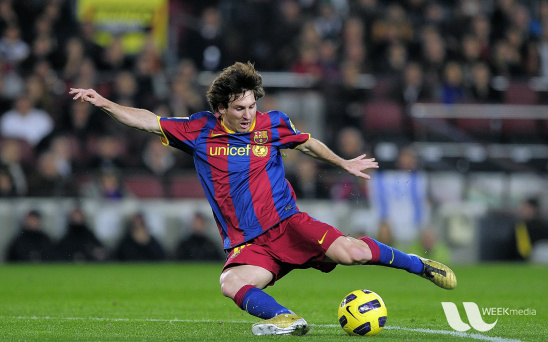

In [5]:
original = Image.open("./example_images/messi5.jpg")
original

## Transform Image and Display

### Basic Usage

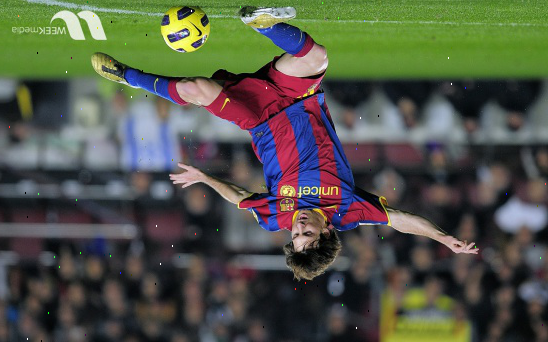

In [6]:
img1 = basic()(original)
img1

#### Function for displaying examples

In [7]:
def plots(original_image, rotate_p=1,flip_p=1,cutout_p=0,add_noise_p=0,rows=8,cols=2):
    images = []
    for y in range(cols):
        for x in range(rows):
            new_image = basic(rotate_p=rotate_p,flip_p=flip_p,cutout_p=cutout_p,add_noise_p=add_noise_p)(original_image)
            new_image = np.array(new_image)
            ht, wd, cc= new_image.shape

            ww = int(wd*1.02)
            hh = int(ht*1.02)

            border = np.ones((hh,ww,cc)).astype(np.uint8)*255
            xx = (ww - wd) // 2
            yy = (hh - ht) // 2
            border[yy:yy+ht, xx:xx+wd] = new_image
            new_image = border.copy()

            if x ==0:
                img = new_image
            else:
                img = np.vstack([img,new_image])
        images.append(img)
    return Image.fromarray(np.hstack(images))

## Multiple Examples

### Using 100% probability on all (for demonstration - not recommended)

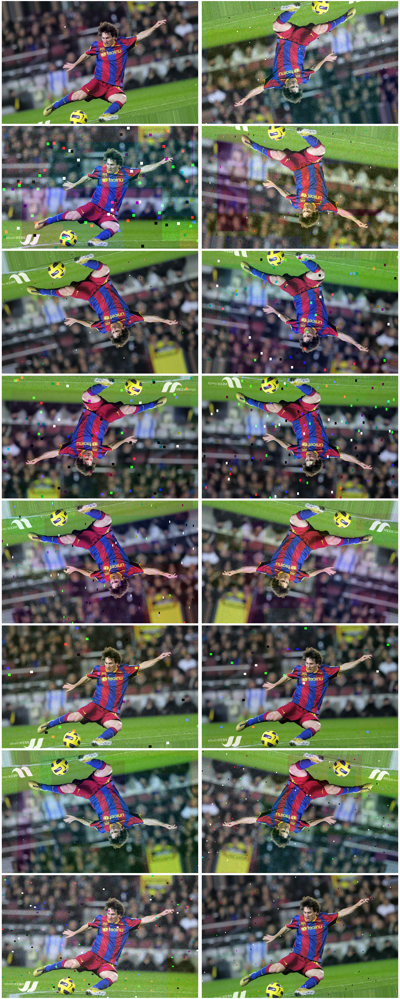

In [8]:
plots(original, rotate_p=1,flip_p=1,cutout_p=1,add_noise_p=1,rows=8,cols=2)

## Change Probability Examples

### Rotate

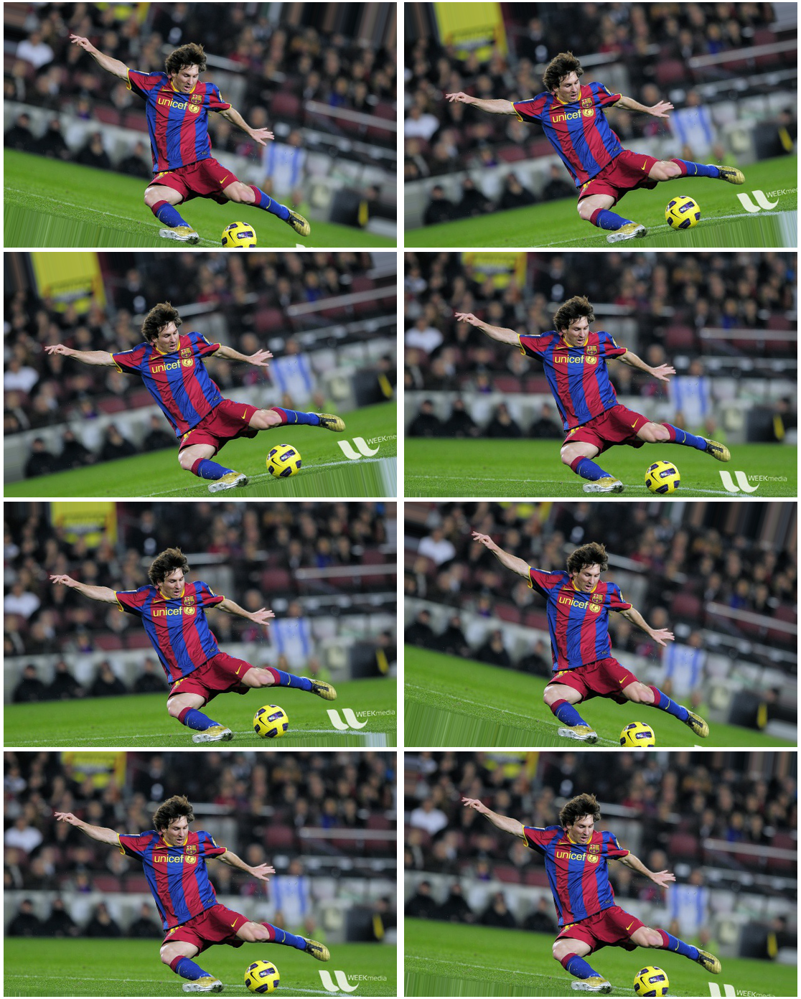

In [9]:
plots(original, rotate_p=1,flip_p=0,cutout_p=0,add_noise_p=0,rows=4,cols=2)

### Flip

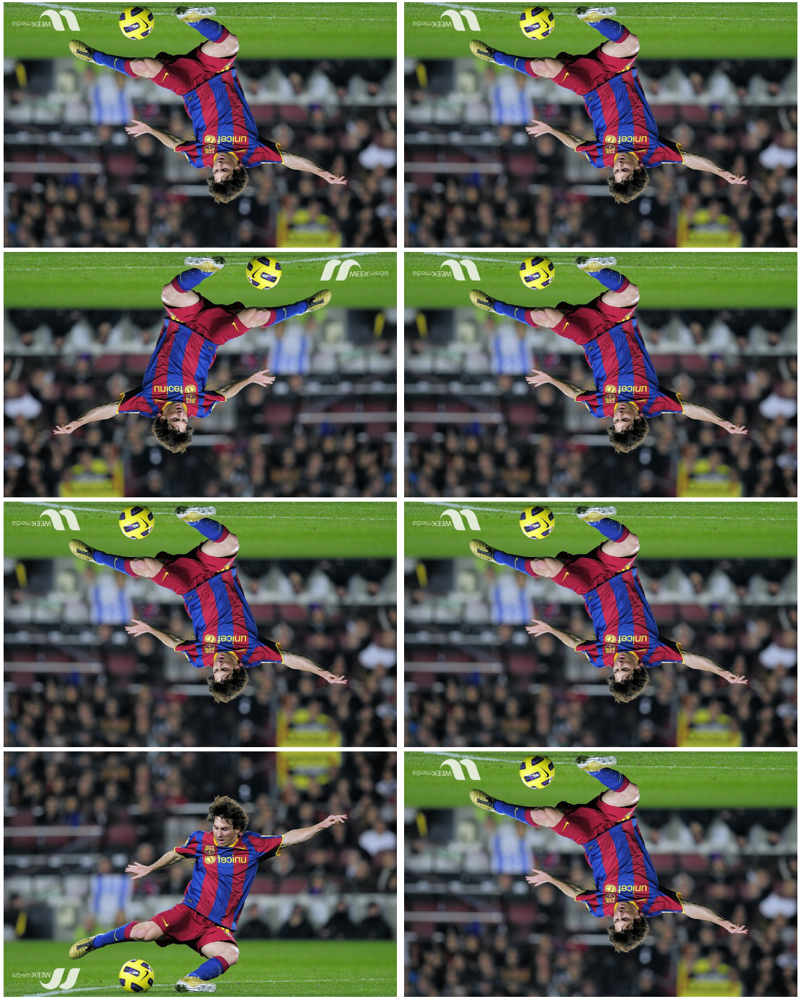

In [10]:
plots(original, rotate_p=0,flip_p=1,cutout_p=0,add_noise_p=0,rows=4,cols=2)


### Cutout

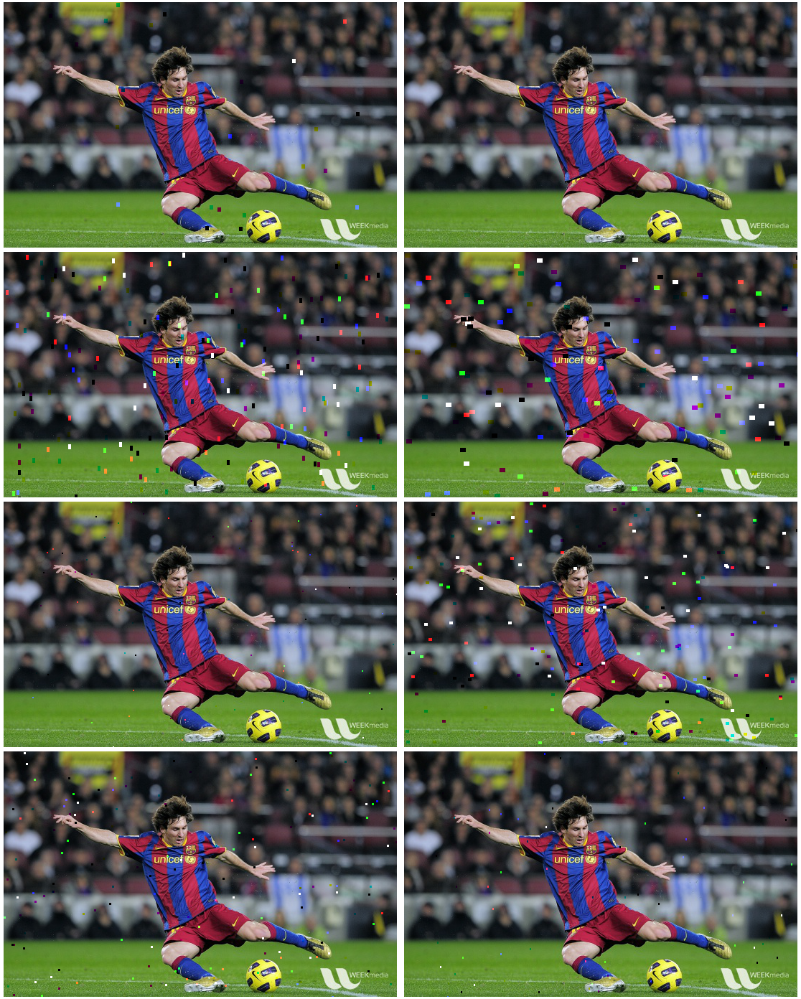

In [11]:
plots(original, rotate_p=0,flip_p=0,cutout_p=1,add_noise_p=0,rows=4,cols=2)


### Noise

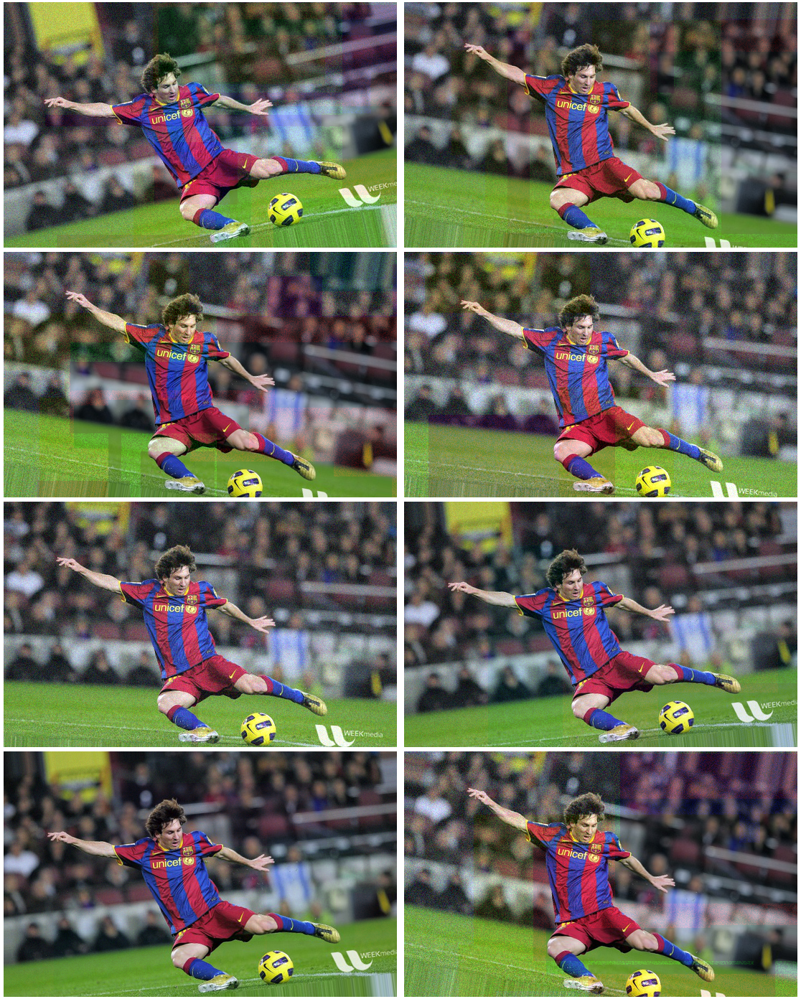

In [12]:
plots(original, rotate_p=1,flip_p=0,cutout_p=0,add_noise_p=1,rows=4,cols=2)
